# Recovery of protein structures using contact maps and Gradient-Based Optimization

<table align=left style="border: 2px solid black; width: 100%; align: left; text-alignement: top; margin-bottom: 20px; font-size: 15px; line-height: 25px;">
    <tr style='border-bottom: 1px solid black;'><td width='200px,%'>Model</td>
        <td><strong>Asymmetrical VAE (AVAE)</strong></td><td></td></tr>
    <tr><td width='200px' style="vertical-align: top">Input data</td><td>sequence of amino-acids [0,1]</td><td>one-hot encoded</td></tr>
    <tr><td width='200px' style="vertical-align: top">Output data</td><td>contact maps (n channels)</td><td>SoftMax [0, 1)</td></tr>
    <tr><td width='200px' style="vertical-align: top">Loss function</td><td>
        KL-Loss function</br>
        reconstruction Loss</td><td></td></tr>
    <tr><td style="vertical-align: top">Tracking</td><td style="vertical-align: top">
        wandb.ai</br>
    </td><td></td></tr>
    <tr><td style="vertical-align: top">Dataset</td><td style="vertical-align: top">
        small_prot_networkx, 5 mai 25</br>
    </td><td></td></tr>
    <tr><td style="vertical-align: top">Comments</td><td style="vertical-align: top">
    </td><td></td></tr>
</table>


In [174]:
import pickle as pkl
import math
from scipy.spatial.distance import cdist
import time
import numpy as np
import matplotlib.pyplot as plt
import importlib, sys, os
from scipy.signal import find_peaks

import torch
import torch.nn.functional as F

from functions import fancy_graphs

import random
random.seed(42)

import ipynbname
notebook_filename = ipynbname.path()
tracking = 'wandb'
if tracking == 'wandb': import wandb

In [175]:
class Dataset:
    def __init__(self, name='default'):
        self.name = name
        self.files = None
        self.proteins = None
        self.subproteins = None
        self.chunk_length = None
        self.configs = None
        self.percentage = None
        self.trainer = None
        self.hyperparams = None
        self.training_aa = None
        self.training_contact = None
        self.dataloaders = None
        self.train_test_in = None
        self.train_test_out = None
        
    @property
    def lengths(self):
        return [protein.len for protein in self.proteins]

    def __repr__(self, s=""):
        
        def pretty(a, b):
            return f"{a:<20s} : {b}\n"
            
        s += pretty('Dataset name', self.name)
        if self.files is not None:        s += pretty('Files', len(self.files))
        if self.proteins is not None:     s += pretty('Proteins', self.proteins.len)
        if self.chunk_length is not None: s += pretty('Chunk length', self.chunk_length)
        if self.subproteins is not None:  s += pretty('Subproteins', self.subproteins.len)
        if self.percentage is not None:   s += pretty('Percentage', self.percentage)
        return s

dataset_names = ['NANOBODIES']
DATASETS = [Dataset(name) for name in dataset_names]
DATASETS[0]

Dataset name         : NANOBODIES

## Data sources

In [176]:
for dataset in DATASETS:
    
    parent_folder = f"datasets/{dataset.name}/processed"
    files = [name for name in os.listdir(parent_folder) if os.path.isfile(os.path.join(parent_folder, name))]
    dataset.files = files

DATASETS[0]

Dataset name         : NANOBODIES
Files                : 1652

In [177]:
cwd = os.getcwd()
print(cwd)

/Users/laurofoletti/Documents/AML/P00_proteins/gradient_optimization


## Protein class definition

In [178]:
if 'classes.proteins' in sys.modules: importlib.reload(sys.modules['classes.proteins'])
from classes.proteins import *

## Datasets

In [179]:
random.seed(42)

UNIQUE_AA = set()
UNIQUE_AA.update(['UNK'])

for dataset in DATASETS:
    
    PROTEINS = Protein_Collection()
               
    for file in dataset.files:
        parent_folder = f"datasets/{dataset.name}/processed"
        filename = f"{cwd}/{parent_folder}/{file}"
        with open(filename, 'rb') as f:
            try:
                data = pkl.load(f)
                protein = Protein(data)
                PROTEINS.append(protein)
            except Exception as e:
                print (file, 'corrupted, removed')
                pass

    PROTEINS.randomize

    for protein in PROTEINS:
        UNIQUE_AA.update(protein.aa)

    dataset.proteins = PROTEINS

print (f"{len(UNIQUE_AA)} unique amino-acids in datasets")
print (UNIQUE_AA)
DATASETS[0]

8RW9_nanobody_C_C_atoms.pkl corrupted, removed
7VND_nanobody_D_D_atoms.pkl corrupted, removed
8FQ7_nanobody_A_A_atoms.pkl corrupted, removed
8SFS_nanobody_C_C_atoms.pkl corrupted, removed
8DTN_nanobody_G_G_atoms.pkl corrupted, removed
21 unique amino-acids in datasets
{'ASP', 'ALA', 'GLY', 'UNK', 'TYR', 'ARG', 'GLU', 'LEU', 'TRP', 'PRO', 'CYS', 'ILE', 'HIS', 'VAL', 'LYS', 'ASN', 'PHE', 'GLN', 'SER', 'THR', 'MET'}


Dataset name         : NANOBODIES
Files                : 1652
Proteins             : 1647

## Chunk length definition

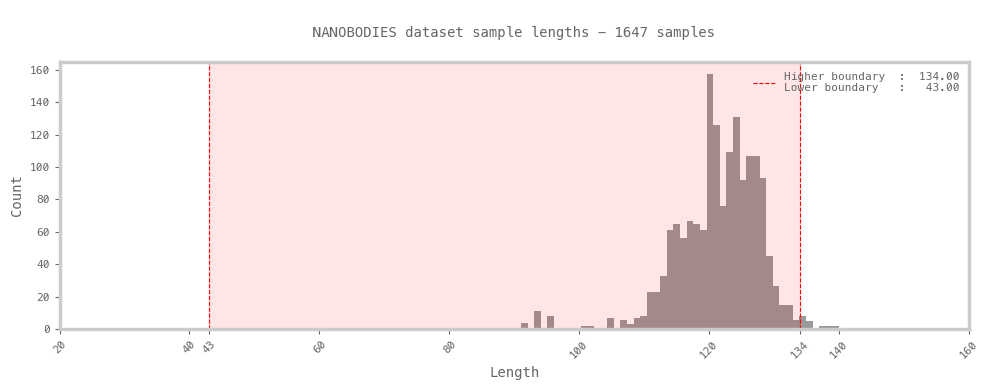

Dataset name         : NANOBODIES
Files                : 1652
Proteins             : 1647
Chunk length         : 43

In [180]:
PERC = 99

def plotMe(dataset):
    
    plt.figure(figsize=(10, 4))
    plt.hist([l for l in dataset.lengths if l < 1000], bins=50, color="#999999")
    
    plt.axvline(x=higher_boundary, color='red', linestyle='--', linewidth=0.8)
    plt.axvline(x=lower_boundary, color='red', linestyle='--', linewidth=0.8)
    plt.axvspan(lower_boundary, higher_boundary, color='red', alpha=0.1)
    
    plt.xticks(
        list(plt.xticks()[0]) + [round(lower_boundary, 2), round(higher_boundary, 2)],
        rotation=45
    )
    
    legend_text = (
        f"Higher boundary  : {dataset.higher_boundary: 7.2f}\n"
        f"Lower boundary   : {dataset.lower_boundary: 7.2f}"
    )
    plt.legend([legend_text], loc='upper right', frameon=False, facecolor='white', fontsize=8.)
    
    plt.title(f"\n{dataset.name} dataset sample lengths - {dataset.proteins.len} samples\n")
    plt.xlabel('Length')
    plt.ylabel('Count')
    
    plt.tight_layout()
    plt.savefig(f"{dataset.name}_lengths.png")
    _ = plt.show()

for dataset in DATASETS:
    
    np_lengths = np.array(dataset.lengths)
    np_lengths = np_lengths[np_lengths<1000]
    percentile = np.percentile(np_lengths, PERC)
    
    higher_boundary = percentile
    lower_boundary = int(percentile * 0.65 * 0.5)

    dataset.chunk_length = lower_boundary
    dataset.higher_boundary = higher_boundary
    dataset.lower_boundary = lower_boundary

    plotMe(dataset)

DATASETS[0]

## Subsequences

In [181]:
dataset_size = 50000

for dataset in DATASETS:
    
    SUBPROTEINS = Protein_Collection()
    
    for source_i, protein in enumerate(dataset.proteins[:1000]):
        if protein.len < dataset.chunk_length or protein.len > 500:
            continue
        aas, cas = protein.explode(dataset.chunk_length)
        for i in range(len(aas)):
            subprotein = Protein(aas=aas[i], cas=cas[i], source_idx=source_i)
            SUBPROTEINS.append(subprotein)
    
    SUBPROTEINS.randomize
    num_sub = SUBPROTEINS.len
    SUBPROTEINS = SUBPROTEINS[:dataset_size]
    PERCENTAGE = round(100*SUBPROTEINS.len/num_sub,2)
    dataset.subproteins = SUBPROTEINS
    dataset.percentage = PERCENTAGE

DATASETS[0]

Dataset name         : NANOBODIES
Files                : 1652
Proteins             : 1647
Chunk length         : 43
Subproteins          : 50000
Percentage           : 41.27

## Contact maps

### Domain boundaries

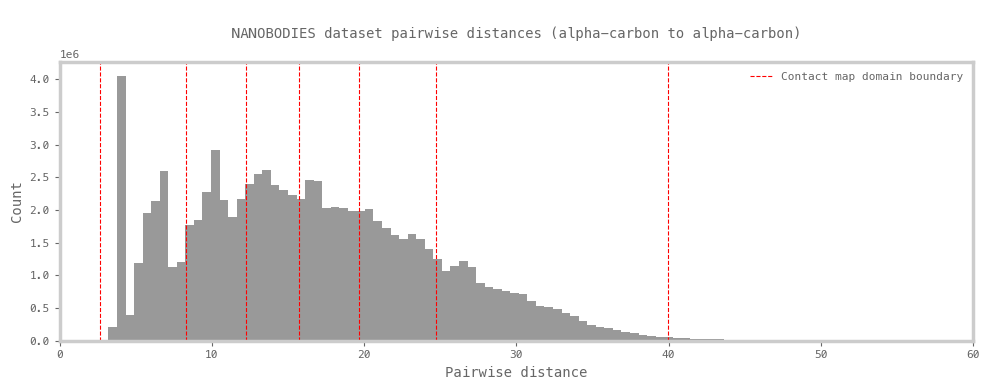

In [182]:
def get_Configs(all_distances=None, n_ranges=4):
    limits = np.percentile(all_distances, [100*i/n_ranges for i in range(n_ranges)] + [99.6]).tolist()
    CONFIGS = []
    for i in range(len(limits)-1):
        CONFIGS.append({'lower':limits[i], 'upper':limits[i+1]})
        
    return CONFIGS

def plotConfigs(dataset, distances):
    plt.figure(figsize=(10,4))
    plt.hist(distances, bins=300, color='#999999')
    plt.xlim(0,60)
    
    plt.axvline(x=dataset.configs[0]['lower'], color='red', linestyle='--', linewidth=0.8)
    for config in dataset.configs:
        plt.axvline(x=config['upper'], color='red', linestyle='--', linewidth=0.8)
    
    legend_text = (f"Contact map domain boundary")
    plt.legend([legend_text], loc='upper right', frameon=False, facecolor='white', fontsize=8.)
    
    plt.title(f"\n{dataset.name} dataset pairwise distances (alpha-carbon to alpha-carbon)\n")
    plt.xlabel('Pairwise distance')
    plt.ylabel('Count')
    
    plt.tight_layout()
    plt.savefig(f"{dataset.name}_distances.png")
    plt.show()

for dataset in DATASETS:
    
    all_distances = [protein.D for protein in dataset.subproteins]
    all_distances = np.array(all_distances)
    all_distances = all_distances[all_distances != 0.]
    
    dataset.configs = get_Configs(all_distances, n_ranges=6)
    plotConfigs(dataset, all_distances)


### Contact maps generation

In [183]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

for dataset in DATASETS:
    
    for protein in dataset.proteins:
        for config in dataset.configs:
            protein.add_contact_map(config['lower'], config['upper'], True)
            
    for protein in dataset.subproteins:
        for config in dataset.configs:
            protein.add_contact_map(config['lower'], config['upper'], True)

## One-Two check (testing coordinates recovery)

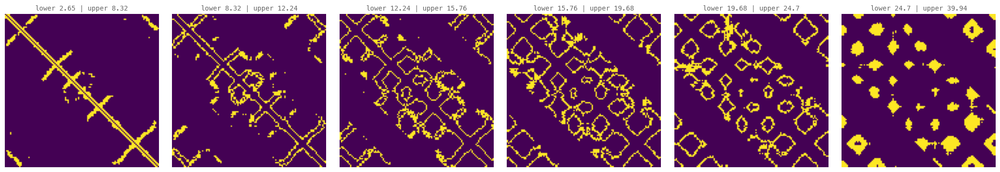

In [184]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

def get_mask(length, bandwidth):
    mask = np.zeros((length, length)).astype(bool)
    offset = int((bandwidth - 1) / 2.)
    for i in range(-offset, offset+1):
        np.fill_diagonal(mask.view('bool')[max(0, -i):, max(0, i):], True)
        np.fill_diagonal(mask.view('bool')[min(0, -i):, min(0, i):], True)
    return mask

def _masked(cmap, mask):
    temp = cmap.copy()
    temp[~mask] = 0.
    return temp

def symmetrize(contact_map):
    symmetrical = np.maximum(contact_map, contact_map.T)
    return symmetrical

def getMasked(cmap, mask):
    temp = cmap.copy()
    temp[~mask] = 0.
    return temp

dataset = DATASETS[0]
protein = dataset.proteins[0]
MASK = get_mask(protein.len, dataset.chunk_length * 2)

cmaps = [protein.add_contact_map(config['lower'], config['upper'], False) for config in dataset.configs]
titles = [f"lower {round(config['lower'],2)} | upper {round(config['upper'],2)}" for config in dataset.configs]
compare_images(cmaps, titles, masking=True, masks=[MASK for _ in range(len(cmaps))])

In [185]:
importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

np_cmaps = np.stack([_masked(cmap, MASK) for cmap in cmaps], axis=-1)
orig_cmap_recon_coords = optim_reconstruct_coords_maps(np_cmaps, dataset.configs, sharpness=15., hard_mask=MASK,
                                                       dim=3, lr=1e-2, max_iter=5000, prints=10)

Step      0 | Total loss:  203.086 | Parts: ['4.47', '15.87', '19.91', '24.06', '43.04', '86.01']
Step    500 | Total loss:   72.001 | Parts: ['2.27', '7.45', '11.15', '12.59', '14.35', '23.89']
Step   1000 | Total loss:   44.959 | Parts: ['1.46', '3.97', '5.80', '7.80', '10.93', '14.82']
Step   1500 | Total loss:   22.500 | Parts: ['0.95', '2.09', '3.27', '4.16', '4.78', '7.15']
Step   2000 | Total loss:   12.773 | Parts: ['0.61', '1.46', '2.27', '2.50', '2.49', '3.40']
Step   2500 | Total loss:    7.537 | Parts: ['0.35', '0.81', '1.28', '1.29', '1.43', '2.37']
Step   3000 | Total loss:    5.960 | Parts: ['0.31', '0.63', '0.72', '0.87', '1.19', '2.22']
Step   3500 | Total loss:    5.874 | Parts: ['0.31', '0.62', '0.71', '0.84', '1.18', '2.19']
Step   4000 | Total loss:    5.870 | Parts: ['0.31', '0.62', '0.71', '0.84', '1.18', '2.19']
Early stopping.


In [186]:
if 'functions.graphics' in sys.modules: importlib.reload(sys.modules['functions.graphics'])
from functions.graphics import *

A = np.array(protein.ca)
C = orig_cmap_recon_coords[0]
ref_slice = slice(10, 15)
C_aligned = align_structures(A, C, ref_slice=ref_slice)

def distance_matrix_mae(A: np.ndarray, B: np.ndarray) -> float:
    D_A = np.linalg.norm(A[:, None, :] - A[None, :, :], axis=-1)
    D_B = np.linalg.norm(B[:, None, :] - B[None, :, :], axis=-1)
    mae = np.mean(np.abs(D_A - D_B))
    return mae

mae = distance_matrix_mae(A, C)

print ()
texts = [f'Protein ref {dataset.files[0]}', 
         f'Protein length {protein.len}, chunk length {dataset.chunk_length}, data coverage {100*MASK.sum()/protein.len**2:6.2f}%',
         f'Mean absolute error {mae:5.2f}']

plotly_2_graphs([A, C_aligned[0]], 'Coordinates recovery from contact maps', labels=texts)

# Training data

In [187]:
for dataset in DATASETS:
    print ()
    print (dataset.name)
    
    dataset.training_aa = torch.stack([torch.tensor(protein.get_oh(list(UNIQUE_AA)), dtype=torch.float32) 
                                       for protein in dataset.subproteins])
    print ('AA training data           ', dataset.training_aa.shape)
    
    dataset.training_contact = torch.stack([torch.tensor(np.stack(protein.contact_maps, axis=-1), dtype=torch.float32)
                                            for protein in dataset.subproteins])
    print ('contact maps training data ', dataset.training_contact.shape)


NANOBODIES
AA training data            torch.Size([50000, 43, 21])
contact maps training data  torch.Size([50000, 43, 43, 6])


In [188]:
if 'functions.customDataset' in sys.modules: importlib.reload(sys.modules['functions.customDataset'])
from functions.customDataset import *

BATCH_SIZE = 32

for dataset in DATASETS:
    dataset.train_test_in =  split_train_test(dataset.training_aa, dataset.subproteins)
    dataset.train_test_out = split_train_test(dataset.training_contact, dataset.subproteins)
    dataset.dataloaders =    [(get_dataloader(dataset.train_test_in[0], dataset.train_test_out[0], batch_size=BATCH_SIZE), 
                               get_dataloader(dataset.train_test_in[1], dataset.train_test_out[1], batch_size=BATCH_SIZE))]


# Model definition and training classes

In [189]:
if 'classes.Asymmetrical_VAE' in sys.modules: importlib.reload(sys.modules['classes.Asymmetrical_VAE'])
if 'functions.AVAE_training' in sys.modules: importlib.reload(sys.modules['functions.AVAE_training'])

from classes.Asymmetrical_VAE import *
from functions.AVAE_training import *

# Hyperparameters and Training

In [190]:
code_size = 256
epochs = 80

for dataset in DATASETS:
    hyperparams = {
        "source_notebook":    notebook_filename,
        "model_name":         "AVAE",
        "id":                 int(time.time()),
        "num_samples":        len(dataset.train_test_in[0]),
        "epochs":             epochs,
        "learning_rate":      1e-5,
        "batch_size":         BATCH_SIZE,
        "input_size":         dataset.train_test_in[0].shape[-1],
        "hidden_size":        code_size,
        "code_size":          code_size,
        "output_size":        dataset.train_test_out[0].shape[-1],
        "channels":           len(dataset.configs),
        "kl_sigma":           1e-5,
        "dropout":            0.0,
        "device":             "cpu",
        "chunk_length":       dataset.chunk_length
    }
    dataset.hyperparams = hyperparams

In [191]:
for dataset in DATASETS:
    
    model = AVAE(dataset.hyperparams)
    optimizer = torch.optim.RMSprop(model.parameters(), lr=dataset.hyperparams['learning_rate'], alpha=0.99, momentum=0.9)
    model.apply(model.weights_init)
    
    Trainer = Training(name=f'AVAE {i}', model=model, optimizer=optimizer, with_kl=True, tracking='wandb')
    dataset.trainer = Trainer

# Tracking

In [192]:
experiment_name = f"Asymmetrical VAE"

In [193]:
for i, dataset in enumerate(DATASETS):

    run_name = f"{dataset.name[:4]} {dataset.chunk_length} | {dataset.trainer.model.code_size} | {dataset.trainer.model.num_samples}"
    
    if tracking=='wandb':
        run = wandb.init(entity="ampc22-bath-university", project=experiment_name, name=run_name, config=dataset.hyperparams)
    
    train_dl, test_dl = dataset.dataloaders[0]
    dataset.trainer.train(train_dl, test_dl, kl_sig=dataset.trainer.model.kl_sigma, loss_type='MSE', 
                          epochs=dataset.trainer.model.epochs, prints=10, 
                          verbose=False, loss_enlarge=1000.)

    with open(f'models/{dataset.name}_trainer_{dataset.trainer.model.code_size}.pkl', 'wb') as f:
        pkl.dump(dataset.trainer, f)

if tracking=='wandb': wandb.finish()

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model AVAE 120
Training on device: cpu
Tracking : wandb
45000 training samples, 5000 test samples, 80 epochs
Loss per item multiplied 1000.0 times.
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [     1/80] Train KL-L:        37.22 | Train RECON-L:        86.81 | Test KL-L:        60.92 | Test RECON-L:        72.96
Epoch [     9/80] Train KL-L:       106.93 | Train RECON-L:        47.89 | Test KL-L:       106.91 | Test RECON-L:        48.42
Epoch [    17/80] Train KL-L:       106.69 | Train RECON-L:        43.22 | Test KL-L:       106.68 | Test RECON-L:        45.06
Epoch [    25/80] Train KL-L:       106.58 | Train RECON-L:        40.97 | Test KL-L:       106.57 | Test RECON-L:        43.70
Epoch [    33/80] Train KL-L:       106.51 | Train RECON-L:        39.50 | Test KL-L:       106.50 | Test RECON-L:        43.08
Epoch [    41/80] Train KL-L:       106.4

test_kl_loss,▅▆▄▃▂█▇▆▄▃█▆▂▁█▄▃▆▄▃██▇▃▁▂▁██▆▃▂██▇▃██▇▃
test_recon_loss,█▅▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_kl_loss,▃▆▄██▃▂▁██▄▂█▄▂█▆▃▂▁█▂▁▇▆▂▁██▆▃█▇▄▃▁█▆▃▁
train_recon_loss,█▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
test_kl_loss,4e-05
test_recon_loss,42.5682
train_kl_loss,4e-05
train_recon_loss,35.73472


In [168]:
wandb.finish()

test_kl_loss,▅▇▇▆▄▃▂▁██▇▆▄▃▂▁██▇▆▄▃▂▁██▇▆▄▃▂▁██▇▆▄▃▂▁
test_recon_loss,█▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_kl_loss,▃▆▆▆▄▃▂▁██▇▆▄▃▂▁██▇▆▄▃▂▁██▇▆▄▃▂▁██▇▆▄▃▂▁
train_recon_loss,█▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
test_kl_loss,4e-05
test_recon_loss,43.99923
train_kl_loss,4e-05
train_recon_loss,37.88403


# Evaluation

In [169]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
if 'functions.evaluation' in sys.modules: importlib.reload(sys.modules['functions.evaluation'])
from functions.misc import *
from functions.evaluation import *

### Contact map predictions

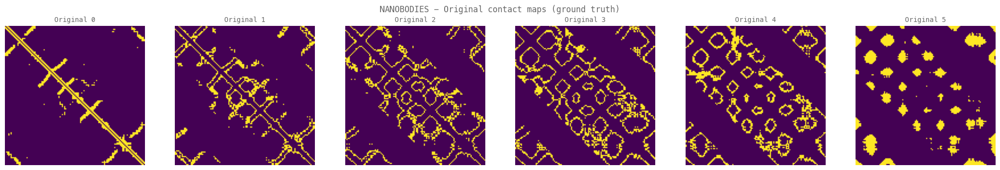

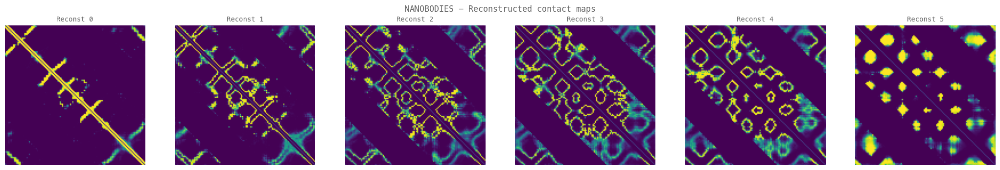

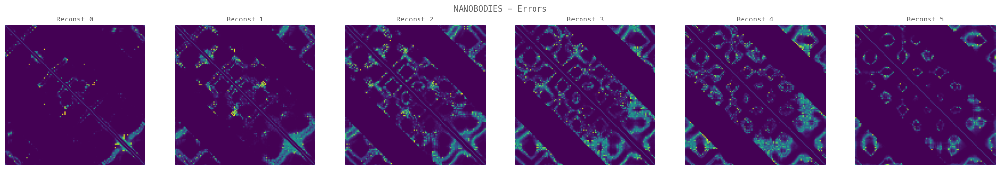

In [194]:
dataset = DATASETS[0]
dataset.trainer.model.eval()
n_evaluations = 30
items = []

for i in range(1, n_evaluations+1):
    protein = dataset.proteins[-i]
    subsequences = get_subsequences(dataset, protein)
    original_cmaps = protein.contact_maps
    
    TRAIN_x, TRAIN_out = get_training_sets(UNIQUE_AA, subsequences)
    contact_maps = Predict(dataset.trainer, TRAIN_x)
    contact_maps = contact_maps.reshape(contact_maps.shape[0], dataset.chunk_length, dataset.chunk_length, len(dataset.configs))
    
    recon_cmaps, hard_masks = [], []
    for i in range(len(dataset.configs)):
        recon_average_contact, hard_mask = get_protein_average_contact(contact_maps[:,:,:,i].squeeze(), protein, dataset.chunk_length)
        recon_cmaps.append(recon_average_contact)
        hard_masks.append(hard_mask)
    
    error_cmaps = [_masked(np.abs(original_cmaps[i]-recon_cmaps[i]), hard_masks[i]) for i in range(len(recon_cmaps))]
    
    item = {'protein': protein, 'original_cmaps': original_cmaps, 'recon_cmaps': recon_cmaps, 
            'error_cmaps': error_cmaps, 'hard_masks': hard_masks} 
    items.append(item)

compare_images(items[0]['original_cmaps'][:6], [f'Original {i}' for i in range(6)], 
               masking=True, masks=items[0]['hard_masks'], suptitle=f"{dataset.name} - Original contact maps (ground truth)", save=True)

compare_images(items[0]['recon_cmaps'][:6], [f'Reconst {i}' for i in range(6)], 
               masking=False, masks=items[0]['hard_masks'], suptitle=f"{dataset.name} - Reconstructed contact maps", save=True)

compare_images(items[0]['error_cmaps'][:6], [f'Reconst {i}' for i in range(6)], 
               masking=False, masks=items[0]['hard_masks'], suptitle=f"{dataset.name} - Errors", save=True)


### Optimization

In [196]:
def sharpen(x, temperature=0.01):
    x = np.array(x)
    e_x = np.exp(x / temperature)
    return e_x / np.sum(e_x, axis=-1, keepdims=True)
    
for item in items:
    recon_contact_maps = item['recon_cmaps']
    recon_contact_maps = [symmetrize(cmap) for cmap in recon_contact_maps]
    recon_contact_maps = np.stack([cmap for cmap in recon_contact_maps], axis=-1)
    #recon_contact_maps = sharpen(recon_contact_maps)
    idx = np.arange(recon_contact_maps.shape[0])
    recon_contact_maps[idx, idx, :] = 0
    
    recon_cmap_recon_coords, _ = optim_reconstruct_coords_maps(recon_contact_maps, dataset.configs, 
                                                               hard_mask=item['hard_masks'][0], sharpness=15.,
                                                               dim=3, lr=1e-2, max_iter=7000, prints=10)
    item['optimized'] = recon_cmap_recon_coords

Step      0 | Total loss:  179.493 | Parts: ['7.56', '13.07', '14.09', '21.84', '36.87', '76.48']
Step    700 | Total loss:   46.619 | Parts: ['3.72', '5.73', '6.93', '7.76', '10.46', '11.80']
Step   1400 | Total loss:   32.248 | Parts: ['2.13', '4.14', '5.63', '5.89', '6.76', '7.65']
Step   2100 | Total loss:   28.920 | Parts: ['1.69', '3.56', '5.10', '5.32', '5.66', '7.56']
Step   2800 | Total loss:   28.389 | Parts: ['1.71', '3.39', '4.97', '5.23', '5.42', '7.63']
Step   3500 | Total loss:   28.350 | Parts: ['1.71', '3.37', '4.97', '5.23', '5.40', '7.64']
Early stopping.
Step      0 | Total loss:  174.814 | Parts: ['6.29', '12.08', '12.85', '20.14', '34.35', '78.65']
Step    700 | Total loss:   65.640 | Parts: ['3.42', '7.98', '9.69', '10.88', '14.39', '19.09']
Step   1400 | Total loss:   38.924 | Parts: ['2.88', '5.41', '6.94', '6.74', '6.91', '9.83']
Step   2100 | Total loss:   33.546 | Parts: ['2.50', '4.31', '5.76', '5.87', '5.98', '8.90']
Step   2800 | Total loss:   32.899 | Pa

In [197]:
def distance_matrix_mae(A: np.ndarray, B: np.ndarray) -> float:
    D_A = np.linalg.norm(A[:, None, :] - A[None, :, :], axis=-1)
    D_B = np.linalg.norm(B[:, None, :] - B[None, :, :], axis=-1)
    mae = np.mean(np.abs(D_A - D_B))
    return mae

mae = []
for item in items:
    A = np.array(item['protein'].ca)
    B = np.array(item['optimized'])
    mae.append(distance_matrix_mae(A, B))

sum(mae)/len(mae)

2.872427213191986

In [198]:
if 'functions.graphics' in sys.modules: importlib.reload(sys.modules['functions.graphics'])
from functions.graphics import *

idx = 9
A = np.array(items[idx]['protein'].ca)
C = np.array(items[idx]['optimized'])
ref_slice = slice(10, 15)
transformed = align_structures(A, C, ref_slice=ref_slice)
C_aligned = transformed[0]

def distance_matrix_mae(A: np.ndarray, B: np.ndarray) -> float:
    D_A = np.linalg.norm(A[:, None, :] - A[None, :, :], axis=-1)
    D_B = np.linalg.norm(B[:, None, :] - B[None, :, :], axis=-1)
    mae = np.mean(np.abs(D_A - D_B))
    return mae

mae = distance_matrix_mae(A, C)

print ()
texts = [f'Protein ref {dataset.files[-idx]}', 
         f'Protein length {item["protein"].len}, chunk length {dataset.chunk_length}, data coverage {100*item["hard_masks"][0].sum()/item["protein"].len**2: 6.2f}%',
         f'Mean absolute error {mae:5.2f}']

plotly_2_graphs([A, C_aligned], f'Reconstruction from predicted contact map', labels=texts)